# Вокодер - реализация принципиальной схемы

Принципильная схема вокодера выглядит так(по моему скромному мнению):

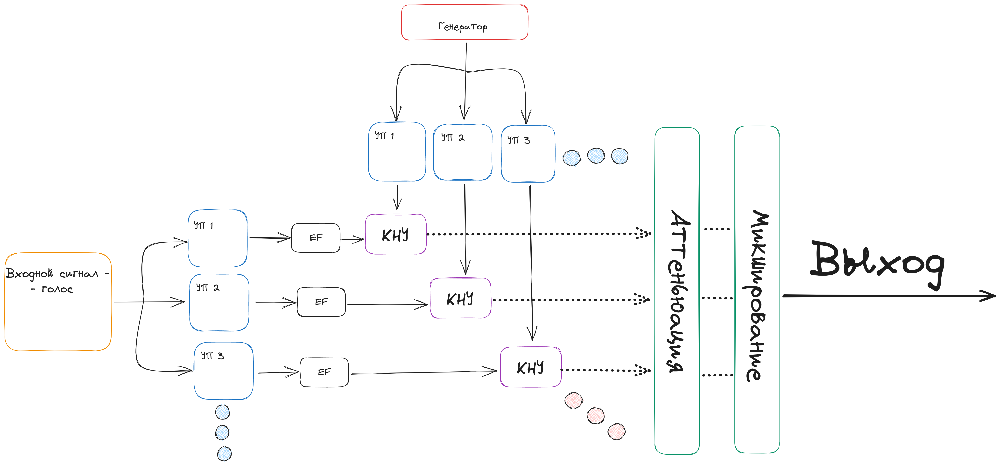

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
from IPython import display
from matplotlib import cm

max_amplitude = np.iinfo(np.int16).max

Загрузим исходный файл для теста 

In [2]:
filepath = r"test_sample_2.wav"
display.Audio(filepath)

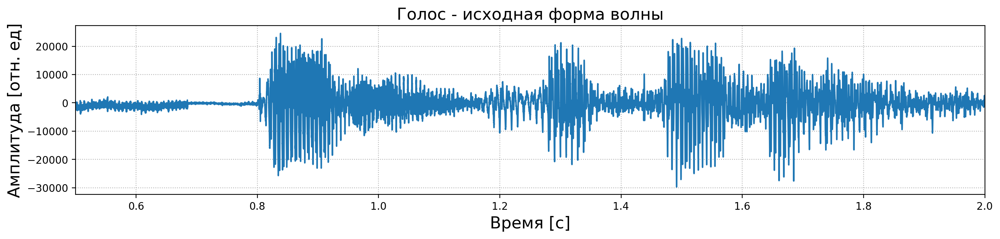

In [3]:
sample_rate, voice = wavfile.read(filepath)
voice = voice[:, 0]
time = np.linspace(0, voice.shape[0] / sample_rate, voice.shape[0])
left_lim, right_lim = 0.5, 2

plt.figure(figsize = (16, 3), dpi = 200)
plt.plot(time, voice)
plt.xlim(left_lim, right_lim)
plt.xlabel("Время [c]", fontsize = 16)
plt.ylabel("Амплитуда [отн. ед]", fontsize = 16)
plt.title("Голос - исходная форма волны", fontsize = 16)
plt.grid(ls = ':')

### Стадия один - цепочка фильтров узкой полосы

In [4]:
center_freqs = np.arange(50, 3100, 100)
bp_slope = 30
bp_filters = [signal.butter(4, Wn = [freq - bp_slope, freq + bp_slope], btype = 'bp', analog = False, fs = 10000, output = 'sos') for freq in center_freqs]
filtered_signals = [signal.sosfilt(bp_filters[i], voice) for i in range(len(center_freqs))]
filtered_signals_envelope = [np.abs(signal.hilbert(sig)) for sig in filtered_signals]

In [5]:
fig, ax = plt.subplots(len(center_freqs), 1, figsize = (20, 3 * len(center_freqs)), dpi = 200, sharex = True)

for ind, (sig, plotable, cutoff, envelope) in enumerate(zip(filtered_signals, ax, center_freqs, filtered_signals_envelope)):
    plotable.plot(time, 
                  sig, 
                  color = cm.rainbow(ind / len(center_freqs)),
                  label = f'Центральная частота {cutoff:.1f} герц')
    plotable.set_xlim(left_lim, right_lim)
    plotable.legend()
    plotable.plot(time, 
                  envelope, 
                  '--',
                  color = cm.rainbow(1 - ind / len(center_freqs)),
                  label = 'Огибающая')
    plotable.grid(ls = ':')
    plotable.set_ylim(-max_amplitude / 3, max_amplitude / 3)


ax[-1].set_xlabel("Время [c]", fontsize = 16)
fig.tight_layout()

### Пропуск основного сигнала через цепочку фильтров. Применение найденных огибающих

Создадим <<несущий>> сигнал смешав несколько пилообразных осцилляторов. Частоты осцилляторов укажем в массиве `osc_frequencies`.

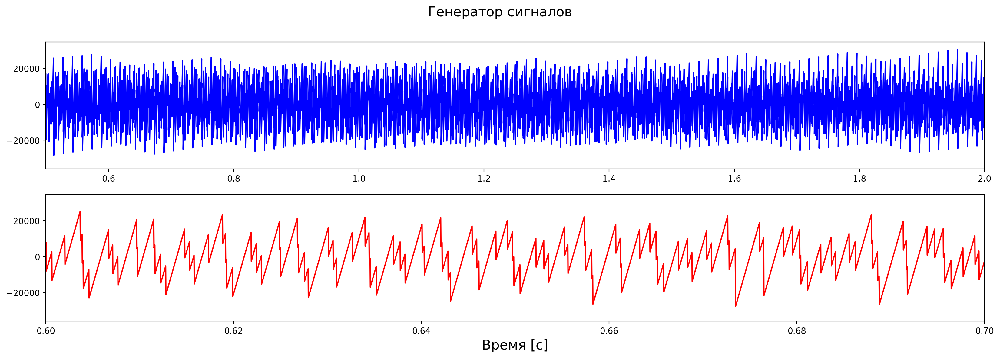

In [6]:
amplitude_osc = max_amplitude
osc_frequencies = [130.8, 523.3 / 2, 659.3 / 2, 784 / 2] # аккорд до-мажор + нота до на две октавы ниже
osc_amp_ratios = [1, 1 / 2, 1 / 2, 1 / 2]
oscillators = np.array([signal.sawtooth(2 * np.pi * freq * time) for amp, freq in zip(osc_amp_ratios, osc_frequencies)])
osc_sum = amplitude_osc * np.sum(oscillators, axis = 0) / len(osc_frequencies)

fig, ax = plt.subplots(2, 1, figsize = (20, 6), dpi = 200)
ax[0].plot(time, osc_sum, color = 'blue')
ax[1].plot(time, osc_sum, color = 'red')
ax[1].set_xlim(0.6, 0.7)
ax[0].set_xlim(left_lim, right_lim)
ax[1].set_xlabel("Время [c]", fontsize = 16)
fig.suptitle("Генератор сигналов", fontsize = 16);

In [7]:
wavfile.write("generator_signal.wav", sample_rate, osc_sum.astype(np.int16))

In [8]:
display.Audio(r"generator_signal.wav")

Пропустим сигнал через фильтры и применим амплитудную огибающую

In [9]:
carrier_filtered = [signal.sosfilt(bp_filters[i], osc_sum) for i in range(len(center_freqs))]
carrier_filtered_amplifiered = [2 * sig * env / amplitude_osc for env, sig in zip(filtered_signals_envelope, carrier_filtered)]
result = sum(carrier_filtered_amplifiered)

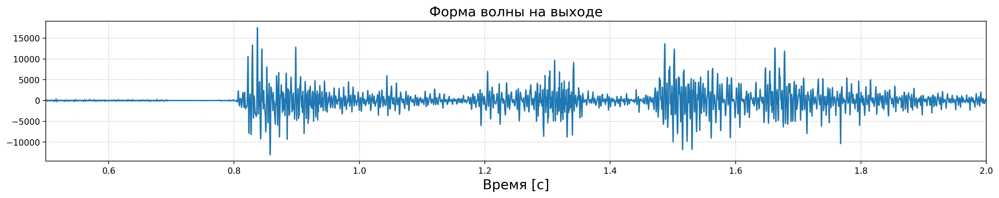

In [10]:
wavfile.write("result_2_lower.wav", sample_rate, (result * 2).astype(np.int16))


plt.figure(figsize = (20, 3), dpi = 200)
plt.plot(time, result)
plt.grid(ls = ':')
plt.xlabel("Время [c]", fontsize = 16)
plt.title("Форма волны на выходе", fontsize = 16)
plt.xlim(left_lim, right_lim);

In [11]:
display.Audio(r"result_2_lower.wav")

## Дополнение

### Пусть осцилляторы будут затюнены под несущую частоту голоса.